In this notebook I train one autoencoder for bare soil reconstruction from Landsat 7 bands: monthly composite during one year and bands:  'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7'. Input training data has been obtained from LUCAS reference baresoil points dataset and GEE images. Data is cleaned in clean_FeatureCollection.ipynb

In [1]:
base_path = '/cats/datastore3/claraenv/code/my-projects/'  # '/home/clara/Documents/'

# Input data

In [51]:
n_hidden_neurons = 30

# Libraries

In [2]:
'''Main'''
import numpy as np
import pandas as pd
import os, time, re
import pickle, gzip
from random import randint
import math
import re
import random

'''Data Viz'''
import matplotlib.pyplot as plt
from matplotlib.pyplot import hist
import matplotlib.cm as cm
import seaborn as sns
color = sns.color_palette()
import matplotlib as mpl

%matplotlib inline

'''Data Prep and Model Evaluation'''
from sklearn import preprocessing as pp
from sklearn.metrics import mean_squared_error
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import StratifiedKFold 
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
import joblib 

'''Algos'''
#import lightgbm as lgb

'''TensorFlow and Keras'''
import tensorflow as tf
import keras
from keras import backend as K
from keras.models import Sequential, Model, load_model
from keras.layers import Activation, Dense, Dropout
from keras.layers import BatchNormalization, Input, Lambda
from keras import regularizers
from keras.losses import mse, binary_crossentropy

from osgeo import gdal
from osgeo import gdal_array
import matplotlib.pyplot as plt
import numpy as np
import sys
from osgeo.gdalconst import *
import os

import math
import codecs

import osgeo #this is necessary for the type comparison in some methods
from osgeo import osr
from osgeo import ogr
from collections import defaultdict
import itertools
from osgeo import gdal_array as gdar
from osgeo import gdalconst as gdct
import glob

# Functions

In [3]:
def is_leap_year(year):
    """ if year is a leap year return True
        else return False """
    if year % 100 == 0:
        return year % 400 == 0
    return year % 4 == 0

def doy(Y,M,D):
    """ given year, month, day return day of year
        Astronomical Algorithms, Jean Meeus, 2d ed, 1998, chap 7 """
    if is_leap_year(Y):
        K = 1
    else:
        K = 2
    N = int((275 * M) / 9.0) - K * int((M + 9) / 12.0) + D - 30
    return N
def scale_MinMax (array, model_filepath, scaler_name):
    
    # Create scaler and scale
    scaler = pp.MinMaxScaler()
    array_scaled = scaler.fit_transform(array)
    
    #Create new folder and save
    mf_scaler = os.path.join(model_filepath, scaler_name)
    if not os.path.exists(mf_scaler):
        os.mkdir(mf_scaler) 
    
    joblib.dump(scaler, mf_scaler + '/scale.mod')
    
    return array_scaled

# Training and testing

In [10]:
data = pd.read_csv(f'{base_path}/autoencoders/bare_soil-detection/data/bareland_LUCAS_2015.csv')
del data['Unnamed: 0']
del data['system:index']
data

,Point_ID,LC,LC0_Desc,LC1_Desc,LU1_Desc,x,y,B1,B1_1,B1_10,...,B7_10,B7_11,B7_3,B7_4,B7_5,B7_6,B7_7,B7_8,B7_9,.geo
0,26841758,F40,Bareland,Other bare soil,Fallow land,-8.466693,37.108232,481.5,495.0,615.0,...,1483.0,1438.0,NaN,3787.0,NaN,3830.5,3752.0,NaN,3098.0,"{""type"":""Point"",""coordinates"":[-8.46669349,37...."
1,26841826,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,-8.630850,37.705463,483.0,356.0,1108.0,...,2083.0,NaN,NaN,1628.0,2222.0,2836.0,3047.5,3415.0,2933.0,"{""type"":""Point"",""coordinates"":[-8.63084954,37...."
2,27001936,F40,Bareland,Other bare soil,Fallow land,-8.726282,38.705168,591.0,NaN,635.0,...,2032.0,1781.0,3713.0,3341.5,3517.5,3253.0,3170.0,3080.0,3020.0,"{""type"":""Point"",""coordinates"":[-8.72628189,38...."
3,27101940,F40,Bareland,Other bare soil,Fallow land,-8.624439,38.762267,437.0,NaN,334.0,...,738.0,887.0,2506.0,2098.0,1463.0,2002.0,2129.5,2071.0,NaN,"{""type"":""Point"",""coordinates"":[-8.62443932,38...."
4,27321784,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,-8.001415,37.439943,323.0,433.0,565.0,...,1745.0,1948.0,NaN,1878.0,2775.0,2773.0,2535.0,3858.0,2760.0,"{""type"":""Point"",""coordinates"":[-8.0014154,37.4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
599,57882508,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,28.474431,44.040401,1900.0,5602.0,NaN,...,NaN,691.0,NaN,NaN,364.0,5373.0,3211.0,2308.5,2372.0,"{""type"":""Point"",""coordinates"":[28.47443109,44...."
600,57922630,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,28.884681,45.092388,4813.0,7504.0,NaN,...,NaN,1387.0,NaN,NaN,1335.0,2663.5,2663.0,2601.5,6208.0,"{""type"":""Point"",""coordinates"":[28.8846806,45.0..."
601,57962548,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,28.688570,44.370723,4971.0,6211.0,NaN,...,NaN,1718.0,NaN,NaN,1235.0,1867.0,1906.0,2586.0,1509.0,"{""type"":""Point"",""coordinates"":[28.6885701,44.3..."
602,64161658,F40,Bareland,Other bare soil,Agriculture (excluding fallow land and kitchen...,33.126346,35.117963,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"{""type"":""Point"",""coordinates"":[33.12634593,35...."


In [23]:
# warning: quizas esto es mejos hacerlo antes
drop = ['Point_ID', 'LC', 'LC0_Desc',  'LC1_Desc', 'LU1_Desc', 'x', 'y', '.geo']
data = data.drop(drop, axis=1)
len(data.columns)

In [28]:
# convert data to array
data_array = np.array(data)
data_array.shape

(604, 77)

In [41]:
train, test = train_test_split(data_array, test_size = 0.3, random_state = 1996)
print('training shape', train.shape)
print('testing shape', test.shape)

training shape (422, 77)
testing shape (182, 77)


In [ ]:
# clean nan


# Scaling

In [45]:
scaler = pp.MinMaxScaler()

# training
train_scaled = np.array(scaler.fit_transform(train))
joblib.dump(scaler, f'{base_path}/autoencoders/bare_soil-detection/models/scale.mod')

# testing
scaler = joblib.load(f'{base_path}/autoencoders/bare_soil-detection/models/scale.mod')
test_scaled = np.array(scaler.transform(test))

---------------------------------------------------------------------------------------------------------

# Autoencoder

In [52]:
# early stopping
es = keras.callbacks.EarlyStopping(monitor = 'mse', mode = 'min', min_delta = 0.001, verbose = 2, patience = 12) 

start = time.time()

lowest_error = 100000000

## Create a folders
mf = f'{base_path}/autoencoders/bare_soil-detection/models/'
mf2 = f'{base_path}/autoencoders/bare_soil-detection/figures/training/'
mf3 = f'{base_path}/autoencoders/bare_soil-detection/figures/error/'
mf4 = f'{base_path}/autoencoders/bare_soil-detection/figures/reflectance/'

## Train AE
print('Training the model...')
for n in range(6):
    # Create model
    model = Sequential()

    # Create layers
    model.add(Dense(units=n_hidden_neurons, activation='linear', input_dim=train_scaled.shape[1]))
    model.add(Dense(units=train_scaled.shape[1], activation='linear'))

    # Compile model (a traditional default value for the learning rate is 0.1 or 0.01)
    opt = keras.optimizers.Adam(learning_rate=0.01)
    tf.keras.losses.MeanSquaredError(reduction="auto", name="mean_squared_error")
    model.compile(optimizer=opt, loss="mean_squared_error", metrics=['mse'])

    # Train
    history = model.fit(x=train_scaled, y=train_scaled,
                        epochs=200,
                        batch_size= None,
                        shuffle=True,
                        validation_data=(test_scaled,test_scaled),
                        verbose=0,
                        callbacks=[es])

    # Save best model
    error = min(history.history['mse'])
    print(f'Min error: {error}')

    if error < lowest_error:
        lowest_error = error
        model.save(mf, overwrite=True, include_optimizer=True)
        # Plot train-test curves
        plt.plot(history.history['mse'])
        plt.plot(history.history['val_mse'])
        plt.title(f'MSE Train Test')
        plt.ylabel('mse')
        plt.xlabel('epoch')
        plt.legend(['train', 'test'], loc='upper left')
        plt.savefig(f'{mf2}/traintestCurvesAE.png', format='png', dpi=300)
        plt.show()
    pass

end = time.time()

print(f'Running time AE --- minutes ----{(end-start)/60}')

Training the model...
Epoch 00012: early stopping
Min error: nan
Epoch 00012: early stopping
Min error: nan
Epoch 00012: early stopping
Min error: nan
Epoch 00012: early stopping
Min error: nan
Epoch 00012: early stopping
Min error: nan
Epoch 00012: early stopping
Min error: nan
Running time AE --- minutes ----0.45434206326802573


# Predictions

In [36]:
# Figures filepaths
mf2 = os.path.join(figures_filepath, 'Training')
mf3 = os.path.join(figures_filepath, 'Error')
mf4 = os.path.join(figures_filepath, 'Reflectance')

# RECONSTRUCT TRAINING DATA

In [37]:
scalers = os.path.join(model_filepath, 'Scalers')
reconstruction = []

for ae in list(range(n_clusters)):
    
    # Upload models
    mf = f'{model_filepath}/Autoencoder_{ae}/'
    model = keras.models.load_model(mf)
    scaler_cluster = joblib.load(scalers + f'/Scaler_{cluster}/scale.mod')
    
    # Scale
    trainScaled_AE = scaler_cluster.transform(train_AE)
    
    ## Prediction
    print(f'Predicting autoencoder {ae}...')
    start_p = time.time()
    recScaled_AE = model.predict(x=trainScaled_AE, verbose=1)
    
    # Descale
    reconstruction_AE = scaler_cluster.inverse_transform(recScaled_AE)
    
    # Convert to original shape
    reconstruction_cluster = reconstruction_AE.transpose()
    reconstruction_cluster = reconstruction_cluster.reshape(training.shape[1], training.shape[0], training.shape[2], training.shape[3])
    images = []
    for img in range(training.shape[0]):
        bands_img = []
        for b in range(training.shape[1]):
            band = reconstruction_cluster[b, img, :, :]
            bands_img.append(band)
        images.append(bands_img)
    reconstruction_cluster = np.array(images)
    reconstruction.append(reconstruction_cluster)
    end_p = time.time()
    print(f'Prediction time AE_{ae} ---minutes--- {(end_p-start_p)/60}')

reconstruction = np.array(reconstruction)

Predicting autoencoder 0...
78998/78998 [==============================] - 80s 1ms/step
Prediction time AE_0 ---minutes--- 1.3769303242365518
Predicting autoencoder 1...
78998/78998 [==============================] - 65s 825us/step
Prediction time AE_1 ---minutes--- 1.1001774668693542
Predicting autoencoder 2...
78998/78998 [==============================] - 83s 1ms/step
Prediction time AE_2 ---minutes--- 1.391375994682312
Predicting autoencoder 3...
78998/78998 [==============================] - 72s 916us/step
Prediction time AE_3 ---minutes--- 1.2186731338500976
Predicting autoencoder 4...
78998/78998 [==============================] - 61s 765us/step
Prediction time AE_4 ---minutes--- 1.0201931873957315
Predicting autoencoder 5...
78998/78998 [==============================] - 67s 853us/step
Prediction time AE_5 ---minutes--- 1.1358412384986878
Predicting autoencoder 6...
78998/78998 [==============================] - 65s 821us/step
Prediction time AE_6 ---minutes--- 1.09482143322626

**SHOW PIXEL RECONSTRUCTION (MOST REPRESENTATIVE PIXEL PER CLUSTER)**

-------------------------------------------------------------------------------------------
                                    CLUSTER 0 --- AUTOENCODER 0
    ------------------------------------------------------------------------------------------------------


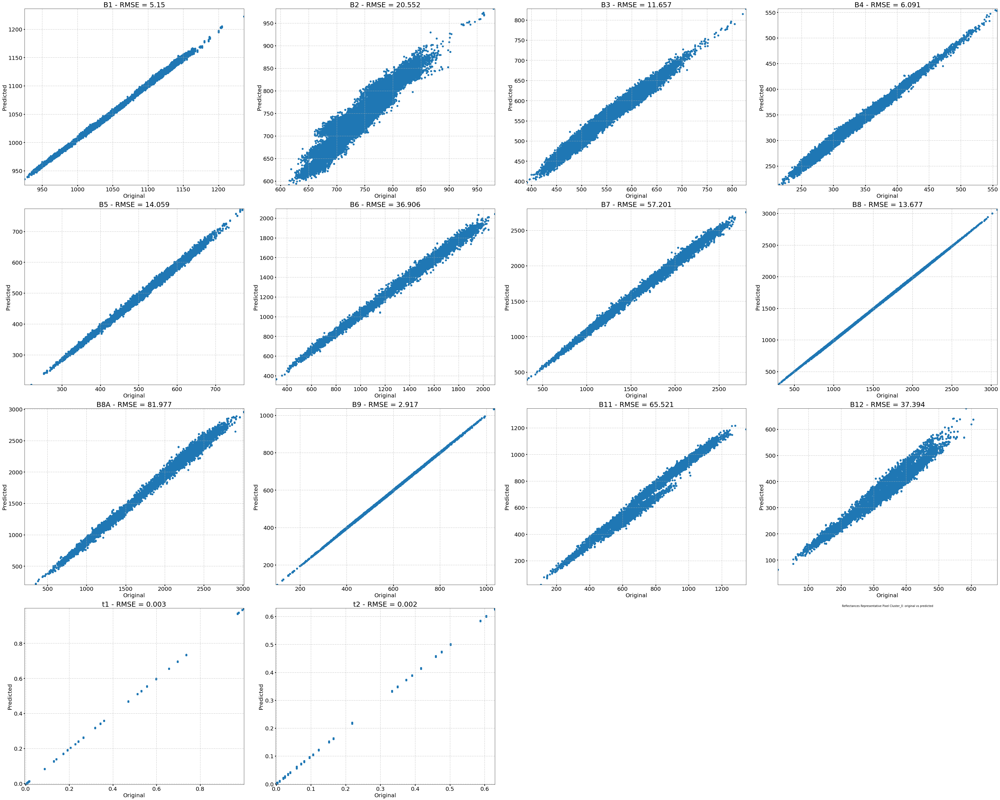

Sum RMSE all bands...
Total RMSE autoencoder 0: 353.107
-------------------------------------------------------------------------------------------
                                    CLUSTER 1 --- AUTOENCODER 1
    ------------------------------------------------------------------------------------------------------


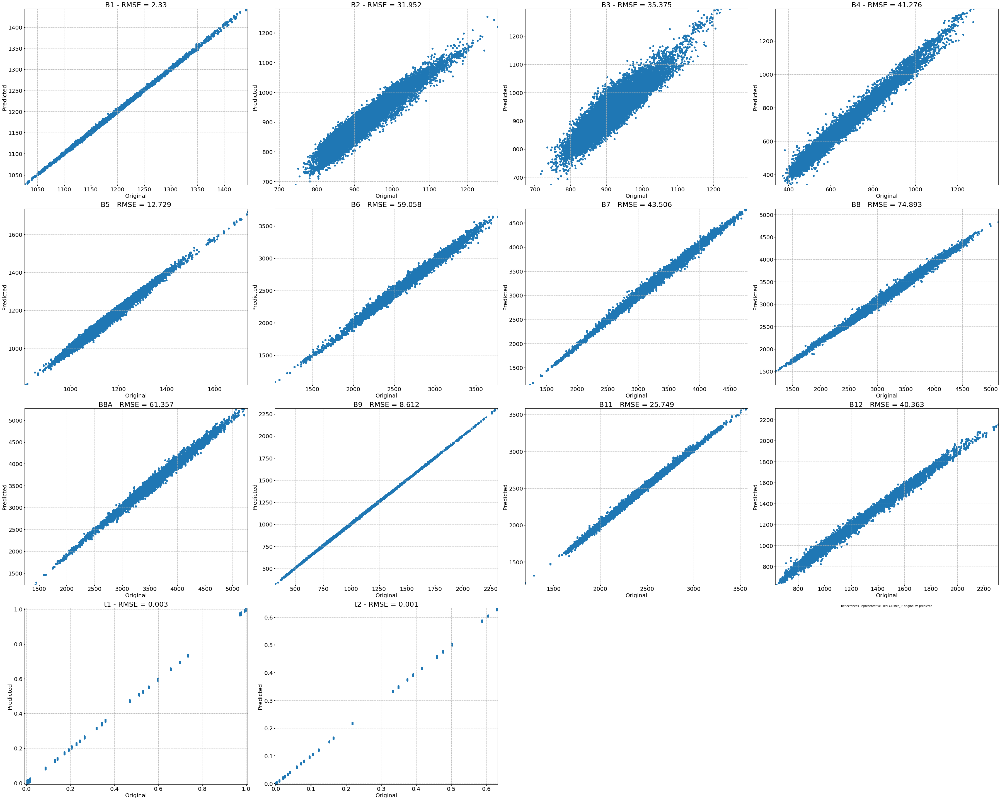

Sum RMSE all bands...
Total RMSE autoencoder 1: 437.204
-------------------------------------------------------------------------------------------
                                    CLUSTER 2 --- AUTOENCODER 2
    ------------------------------------------------------------------------------------------------------


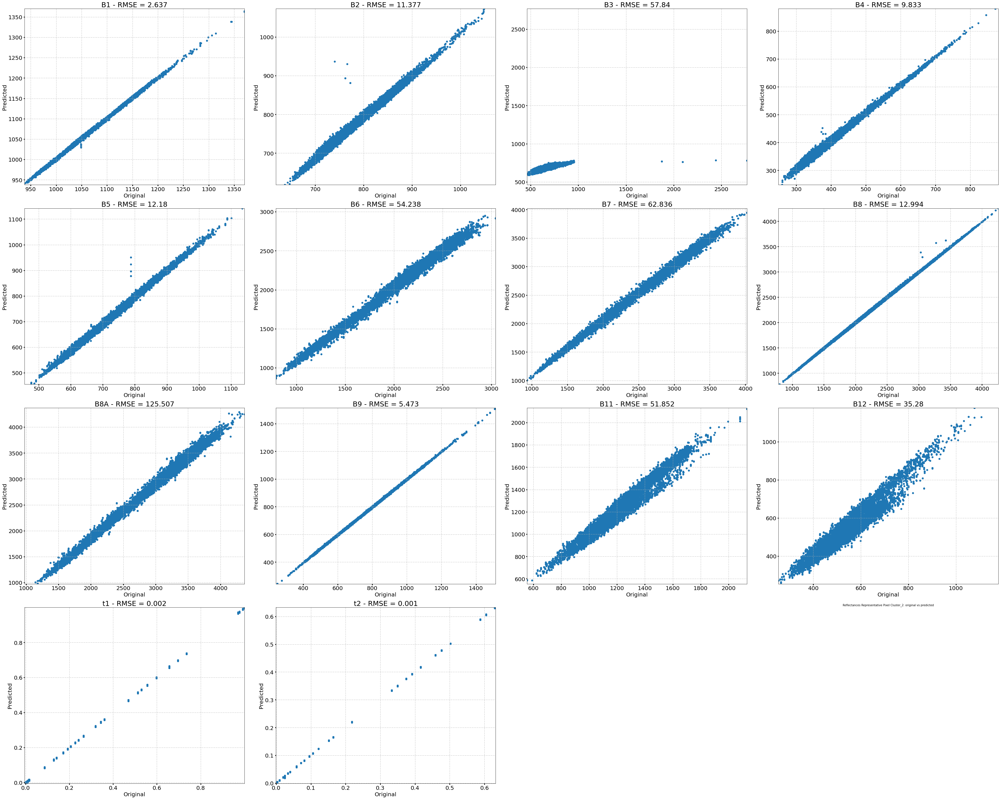

Sum RMSE all bands...
Total RMSE autoencoder 2: 442.05
-------------------------------------------------------------------------------------------
                                    CLUSTER 3 --- AUTOENCODER 3
    ------------------------------------------------------------------------------------------------------


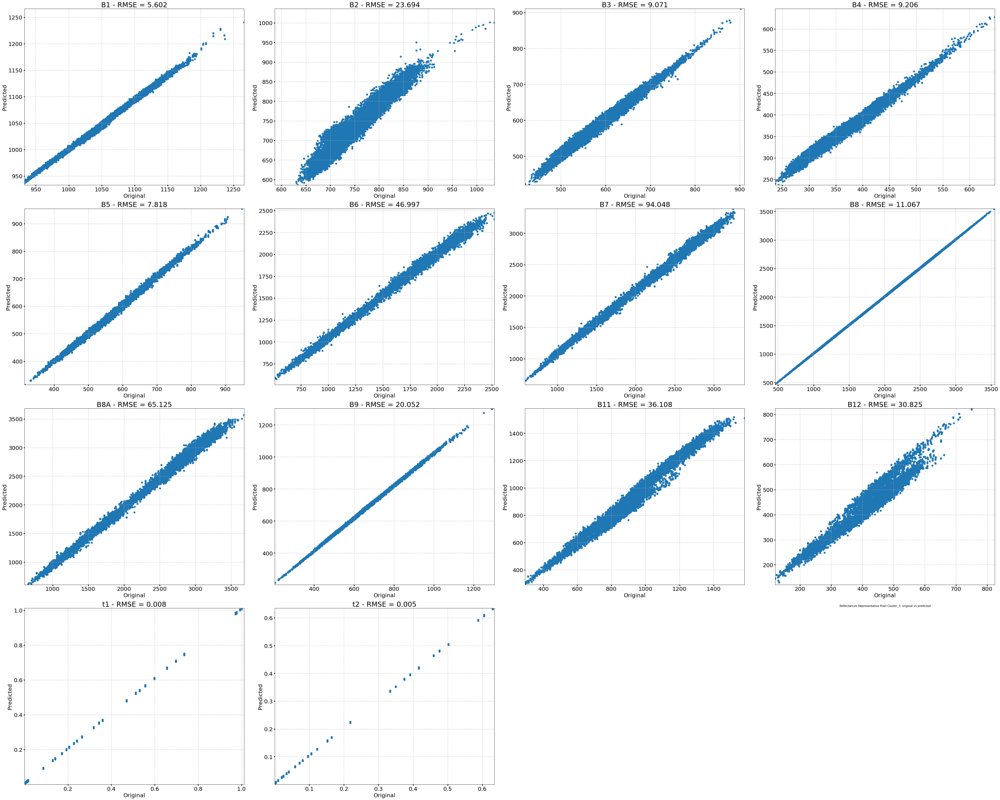

Sum RMSE all bands...
Total RMSE autoencoder 3: 359.62600000000003
-------------------------------------------------------------------------------------------
                                    CLUSTER 4 --- AUTOENCODER 4
    ------------------------------------------------------------------------------------------------------


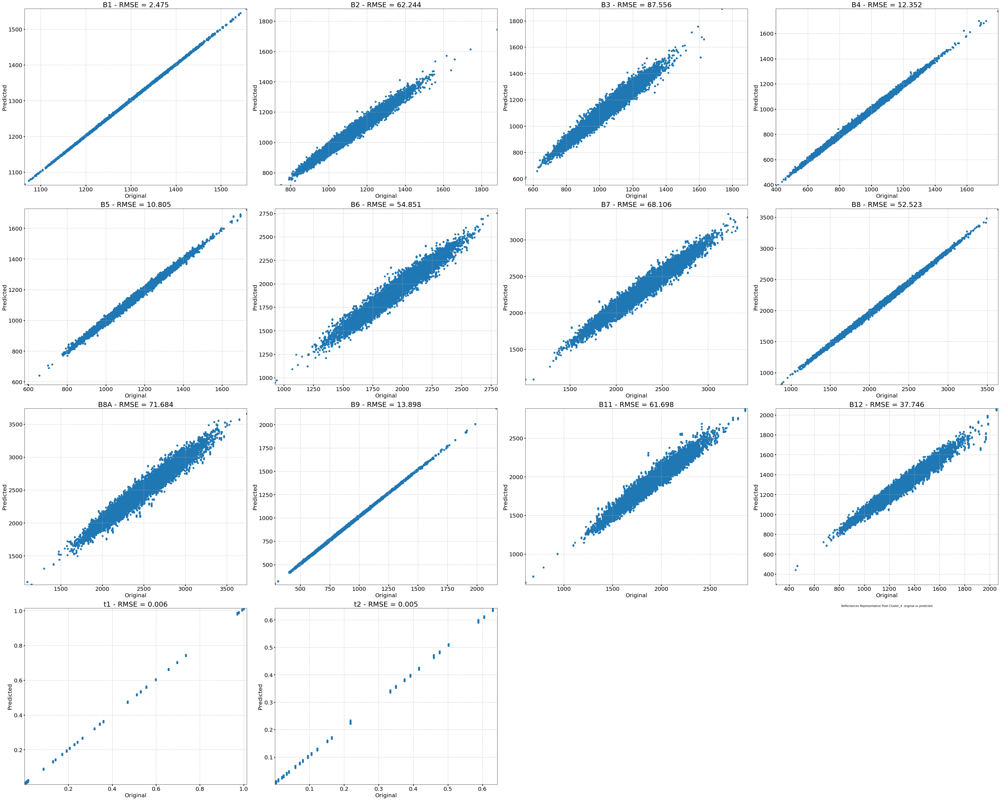

Sum RMSE all bands...
Total RMSE autoencoder 4: 535.949
-------------------------------------------------------------------------------------------
                                    CLUSTER 5 --- AUTOENCODER 5
    ------------------------------------------------------------------------------------------------------


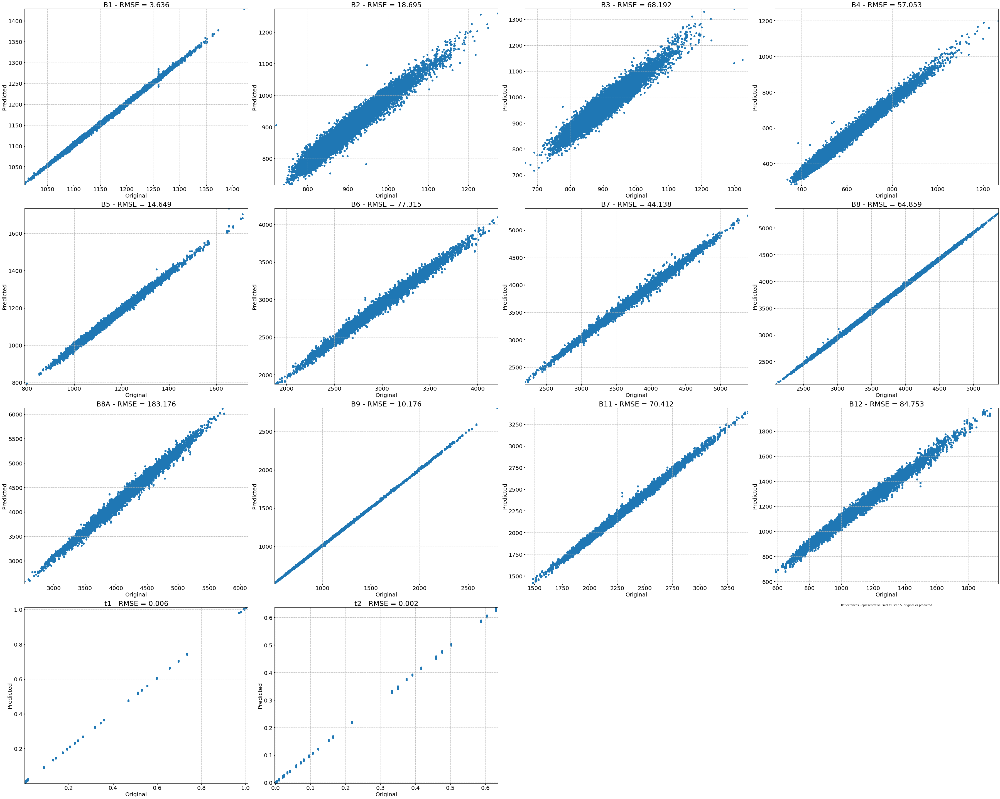

Sum RMSE all bands...
Total RMSE autoencoder 5: 697.062
-------------------------------------------------------------------------------------------
                                    CLUSTER 6 --- AUTOENCODER 6
    ------------------------------------------------------------------------------------------------------


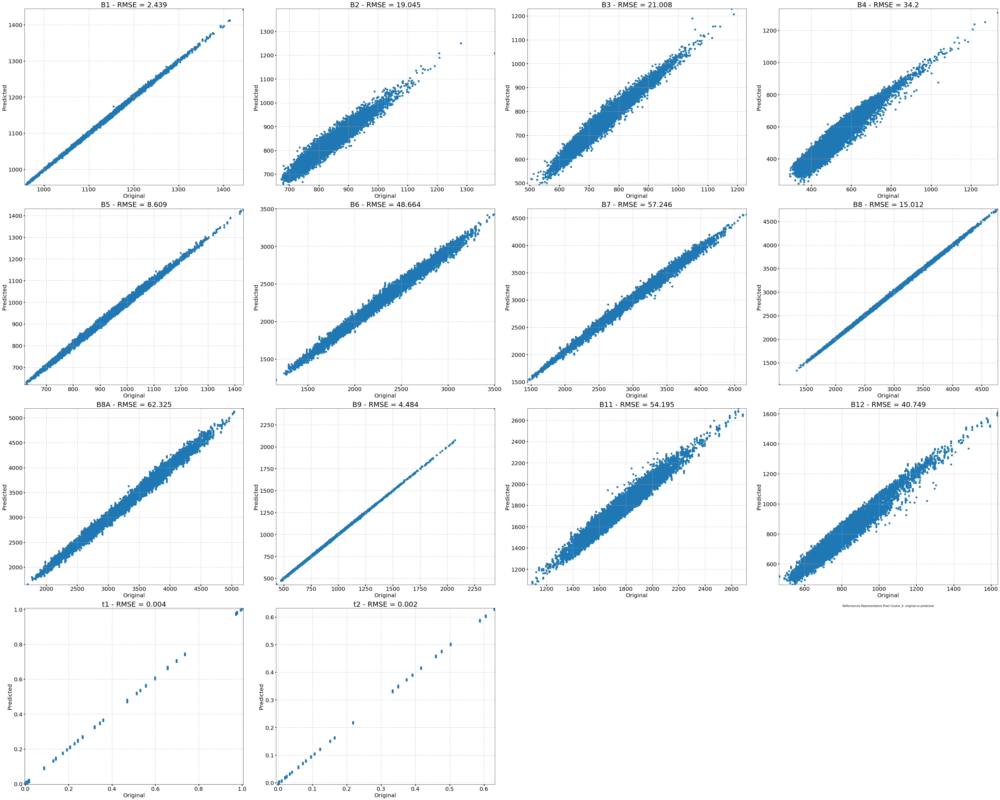

Sum RMSE all bands...
Total RMSE autoencoder 6: 367.982
-------------------------------------------------------------------------------------------
                                    CLUSTER 7 --- AUTOENCODER 7
    ------------------------------------------------------------------------------------------------------


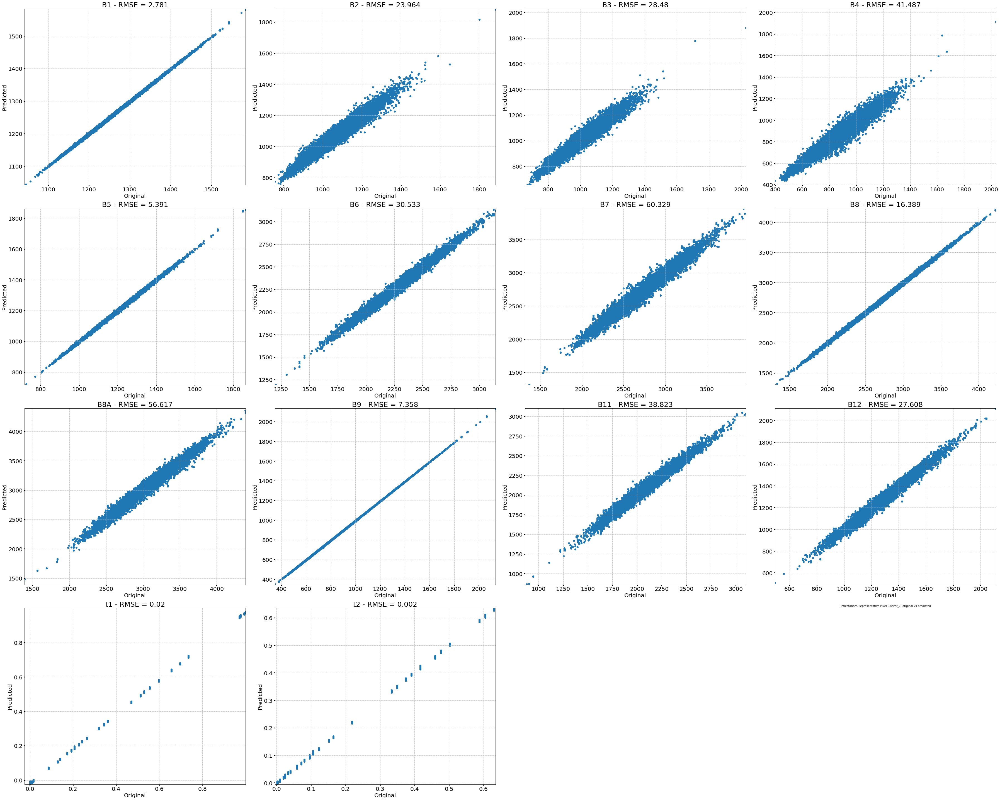

Sum RMSE all bands...
Total RMSE autoencoder 7: 339.782


In [38]:
from matplotlib.cbook import flatten
# Prepare subplots
n_figures = len(bands)
n_rows = int(math.ceil((n_figures)**(1/2))) #add an extra row to have space for the colorbar
n_cols = int(math.ceil(n_figures/n_rows))
rows=[]
columns = []
for row in range(n_rows):
    for col in range(n_cols):
        rows.append(row)
        columns.append(col)

# Show reflectances for each AE
for ae in range(n_clusters):
    print(f'''-------------------------------------------------------------------------------------------
                                    CLUSTER {ae} --- AUTOENCODER {ae}
    ------------------------------------------------------------------------------------------------------''')
    
    # Plot reflectances original pixel vs. reconstructed
    reconstruction_cluster = reconstruction[ae]
    pixels = rep_pix_allCluster[ae]
    pixel = pixels[0]
    fig, axs = plt.subplots(n_rows, n_cols, figsize= (50,40))
    rms_l = []
    
    # reflectance bands: B1, B2, B3, B4, B5
    for sp in range(n_figures):
        ori_sublist = []
        pre_sublist = []
        for pixel in pixels:
            ori_pixel = list(training[:,sp, pixel[0], pixel[1]])
            ori_sublist.append(ori_pixel)
            pre_pixel = list(reconstruction_cluster[:,sp, pixel[0], pixel[1]])
            pre_sublist.append(pre_pixel)
        #print(ori_sublist)
        #print(pre_sublist)
        ori = list(flatten(ori_sublist))
        pre = list(flatten(pre_sublist))
        rms = round(mean_squared_error(ori, pre, squared=False),3)
        rms_l.append(rms)
        ax = axs[rows[sp], columns[sp]]
        im = ax.scatter(ori, pre)
        ax.set_xlim(min(min(list(ori)), min(list(pre))), max(max(list(ori)), max(list(pre))))
        ax.set_ylim(min(min(list(ori)), min(list(pre))), max(max(list(ori)), max(list(pre))))
        ax.set_title(f'{bands[sp]} - RMSE = {rms}', fontsize=25)
        ax.set_xlabel('Original', fontsize=20)
        ax.set_ylabel('Predicted', fontsize=20)
        ax.grid(True, linestyle='-.')
        ax.tick_params(labelsize=20, width=3)
    
    # delete empty figures
    for sp in range(n_figures, n_rows*n_cols):
        axs[rows[sp], columns[sp]].set_axis_off()

    plt.title(f'Reflectances Representative Pixel Cluster_{ae}: original vs predicted', fontsize=10)
    plt.tight_layout()
    plt.savefig(f'{mf4}/OriginalvsReconstructed_AE_{ae}.png', format='png', dpi=300)
    plt.show()
    
    # print total RMSE
    print('Sum RMSE all bands...')
    print(f'Total RMSE autoencoder {ae}: {np.sum(np.array(rms_l))}')
    
    # save RMSE
    dict = {'RMSE' : np.sum(np.array(rms_l))}
    f = open( f'{model_filepath}/RMSE_pixel_training_reconstruction.txt', 'w')
    f.write( repr(dict) + '\n' )
    f.close()

# PREDICT TEST DATA

In [39]:
scalers = os.path.join(model_filepath, 'Scalers')
prediction = []

for ae in list(range(n_clusters)):
    
    # Upload models
    mf = f'{model_filepath}/Autoencoder_{ae}/'
    model = keras.models.load_model(mf)
    scaler_cluster = joblib.load(scalers + f'/Scaler_{cluster}/scale.mod')
    
    # Scale
    testScaled_AE = scaler_cluster.transform(test_AE)
    
    ## Prediction
    print(f'Predicting autoencoder {ae}...')
    start_p = time.time()
    predScaled_AE = model.predict(x=testScaled_AE, verbose=1)
    
    # Descale
    prediction_AE = scaler_cluster.inverse_transform(predScaled_AE)

    # Convert to original shape
    prediction_cluster = prediction_AE.transpose()
    prediction_cluster = prediction_cluster. reshape(testing.shape[0], testing.shape[1], testing.shape[2])
    prediction.append(prediction_cluster)
    end_p = time.time()
    print(f'Prediction time AE_{ae} ---minutes--- {(end_p-start_p)/60}')

prediction = np.array(prediction)

Predicting autoencoder 0...
2136/2136 [==============================] - 2s 1ms/step
Prediction time AE_0 ---minutes--- 0.03804523150126139
Predicting autoencoder 1...
2136/2136 [==============================] - 2s 856us/step
Prediction time AE_1 ---minutes--- 0.03200306495030721
Predicting autoencoder 2...
2136/2136 [==============================] - 2s 956us/step
Prediction time AE_2 ---minutes--- 0.03588738441467285
Predicting autoencoder 3...
2136/2136 [==============================] - 2s 889us/step
Prediction time AE_3 ---minutes--- 0.03323607047398885
Predicting autoencoder 4...
2136/2136 [==============================] - 1s 485us/step
Prediction time AE_4 ---minutes--- 0.018885338306427003
Predicting autoencoder 5...
2136/2136 [==============================] - 2s 892us/step
Prediction time AE_5 ---minutes--- 0.03346958160400391
Predicting autoencoder 6...
2136/2136 [==============================] - 1s 567us/step
Prediction time AE_6 ---minutes--- 0.021824618180592854
Predic

**Calculate error: RMSE (with scaled values)**

In [40]:
error_list = []
ae=0
for prediction_cluster in prediction:    
    print(f'Calculating error autoencoder {ae}...')
    ae=ae+1
    
    # RMSE y=bands of one image -> predicted vs original + mean of the RMSE between all images
    dif = (prediction_cluster[:-2,:,:]-testing[:-2,:,:])**2
    suma = np.sum(dif, axis = 0)
    div = suma/(testing.shape[0]-2)
    square = div**(1/2)
    error_list.append(square)

error_list = np.array(error_list)

Calculating error autoencoder 0...
Calculating error autoencoder 1...
Calculating error autoencoder 2...
Calculating error autoencoder 3...
Calculating error autoencoder 4...
Calculating error autoencoder 5...
Calculating error autoencoder 6...
Calculating error autoencoder 7...


**Plot error**

In [41]:
##hyperparameters (visualization)
vmin= 0
vmax= 100

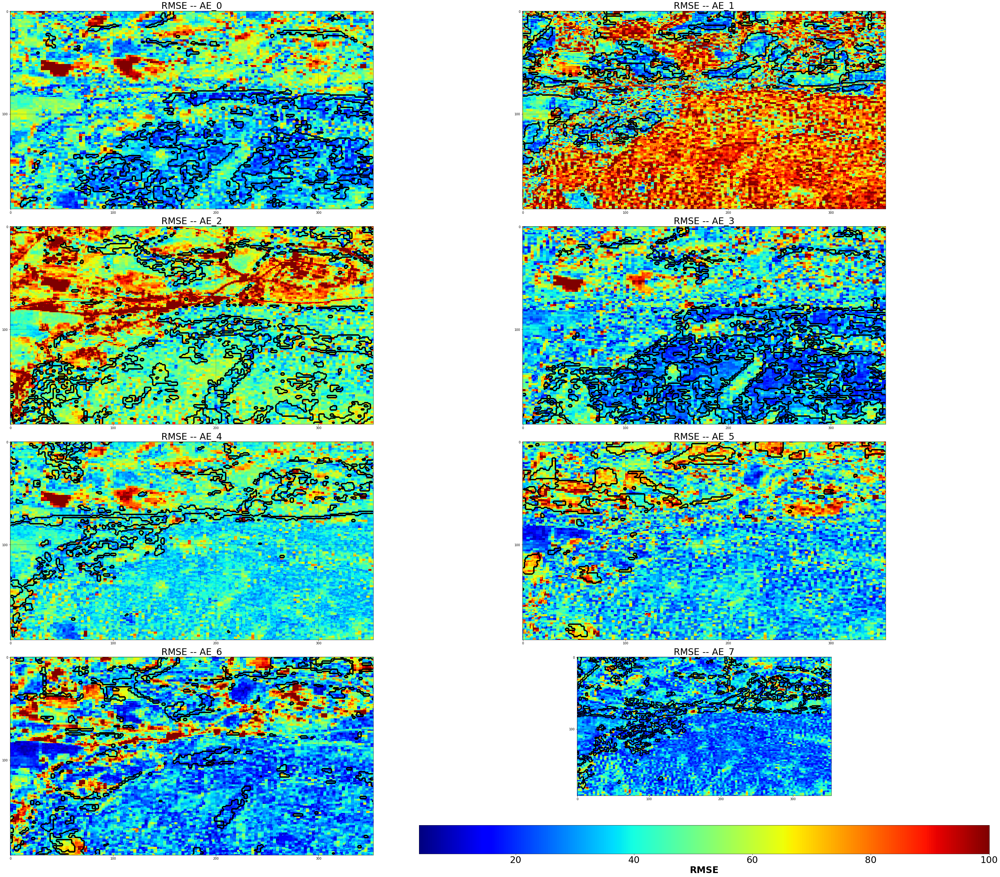

In [42]:
# Prepare subplots
n_figures = n_clusters
n_rows = int(math.ceil((n_figures)**(1/2))) +1
n_cols = int(math.ceil(n_figures/n_rows))
fig, axs = plt.subplots(n_rows, n_cols, figsize= (50,40))
rows=[]
columns = []
for row in range(n_rows):
    for col in range(n_cols):
        rows.append(row)
        columns.append(col)

# RMSE in each subplot: plot error matrices
cm = 'jet'
for ae in range(n_figures):
    mean = error_list[ae]
    cluster = labels==ae
    ax = axs[rows[ae], columns[ae]]
    im = ax.imshow(mean, cmap=cm, vmax=100)
    ax.contour(cluster, colors='black', linewidths=1.5)
    ax.set_xticks(np.arange(mean.shape[1]+1, step=100))
    ax.set_yticks(np.arange(mean.shape[0]+1, step=100))
    ax.grid(color='black', linewidth=0.3)
    ax.set_title(f'RMSE -- AE_{ae}', fontsize=30)

# delete empty figures
for image in range(n_figures, n_rows*n_cols):
    axs[rows[image], columns[image]].set_axis_off()

# colorbar
cb = plt.colorbar(im, orientation="horizontal", pad=0.15)
cb.set_label(label='RMSE', size=30, weight='bold')
cb.ax.tick_params(labelsize=30)

# save
plt.tight_layout()
#plt.savefig(f'{mf3}/RMSE_all_AE.png', format='png', dpi=300)
plt.show()

**Min Error of All Autoencoders in AOI**

In [57]:
##hyperparameters (visualization)
vmin1= 0
vmax1= 10

-------------------------------------------------------------------------------------------
                                        MINIMUM VALUE OF ERRORS
    ------------------------------------------------------------------------------------------------------


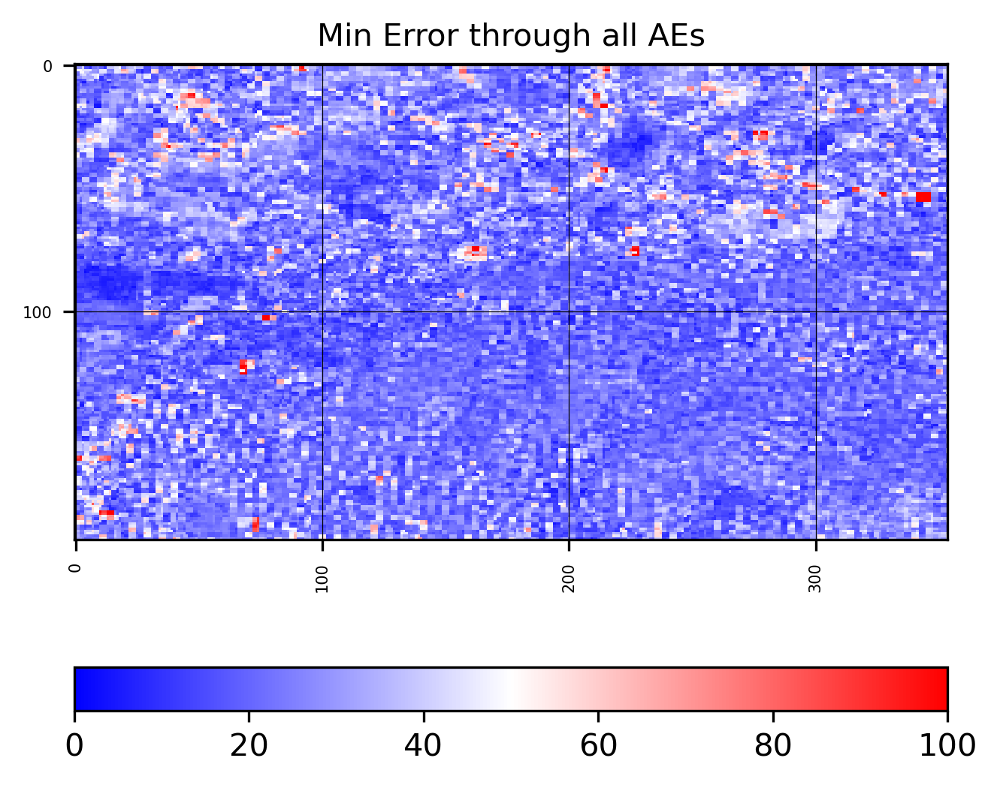

In [44]:
## Min Error of All Autoencoders
print(f'''-------------------------------------------------------------------------------------------
                                        MINIMUM VALUE OF ERRORS
    ------------------------------------------------------------------------------------------------------''')
error = error_list.min(axis=0)
# Plot min error
fig, ax = plt.subplots(figsize=(5,5), dpi=300)
ax = plt.imshow(error, cmap='bwr', interpolation = 'nearest',vmin=vmin1, vmax=vmax1)
plt.xticks(np.arange(error.shape[1]+1, step=100), fontsize=5, rotation=90)
plt.yticks(np.arange(error.shape[0]+1, step=100), fontsize=5, rotation=0)
plt.grid(color='black', linewidth=0.3)
plt.title(f'Min Error through all AEs', fontsize=10)
fig.colorbar(ax, orientation='horizontal')
#plt.savefig(f'{mf3}/min_error.png', format='png', dpi=300)
plt.show()

**REPRESENT MIN ERROR BOUNDING CLUSTERS**

<Figure size 432x288 with 0 Axes>

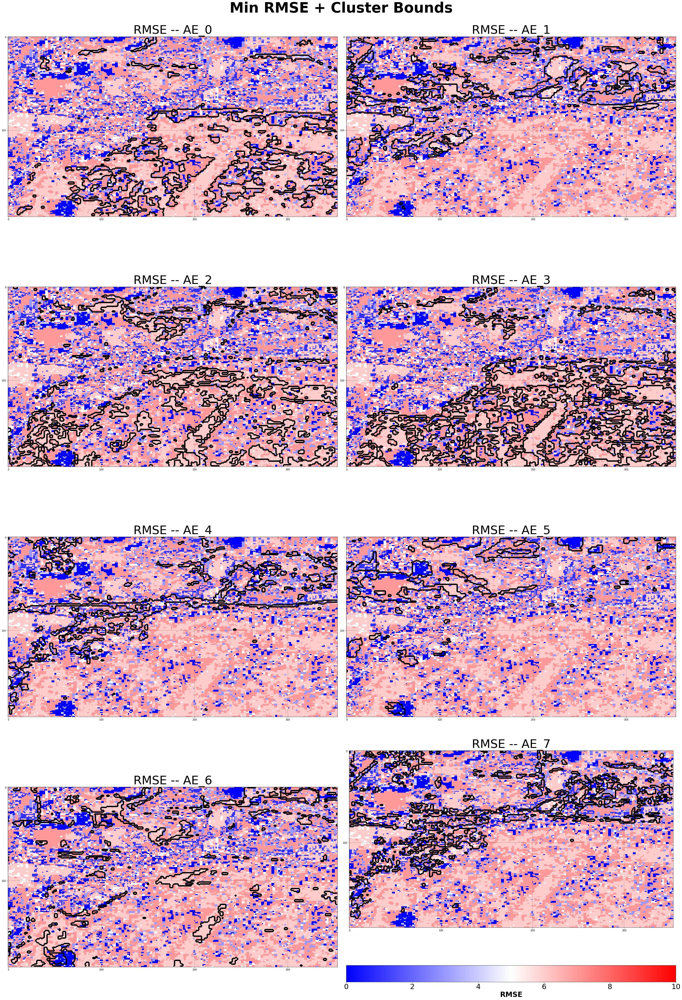

In [58]:
plt.figure()
# Prepare subplots
n_figures = n_clusters
n_rows = 4 
n_cols = 2
rows=[]
columns = []
for row in range(n_rows):
    for col in range(n_cols):
        rows.append(row)
        columns.append(col)

# Subplots and figure title
fig, axs = plt.subplots(n_rows, n_cols, figsize= (40,60))
fig.suptitle(f'Min RMSE + Cluster Bounds', fontsize = 60, fontweight="bold")

# RMSE in each subplot: plot error matrices
cm = 'jet'
for sp in range(n_figures):
    cluster = labels==sp
    ax = axs[rows[sp], columns[sp]]
    im = ax.imshow(error, cmap='bwr', interpolation = 'nearest',vmin=vmin1, vmax=vmax1)
    ax.contour(cluster, colors='black', linewidths=2)
    ax.set_xticks(np.arange(error.shape[1]+1, step=100))
    ax.set_yticks(np.arange(error.shape[0]+1, step=100))
    ax.grid(color='black', linewidth=0.3)
    ax.set_title(f'RMSE -- AE_{sp}', fontsize=50)

# delete empty figures
for image in range(n_figures, n_rows*n_cols):
    axs[rows[image], columns[image]].set_axis_off()

# colorbar
cb = plt.colorbar(im, orientation="horizontal", pad=0.15)
cb.set_label(label='RMSE', size=30, weight='bold')
cb.ax.tick_params(labelsize=30)

# save
fig.subplots_adjust(top=0.9)
plt.tight_layout()
plt.savefig(f'{mf3}/minRMSE_ClusterBounds.png', format='png', dpi=300)
plt.show()

# Reconstruction

**AUTOENCODERS**

In [47]:
# Autoencoder of each pixel
for y in range(testing.shape[1]):
    for x in range(testing.shape[2]):
        for c in range(n_clusters):
            if error[y,x] == error_list[c, y, x]:
                error[y,x] = c
            else:
                pass

<Figure size 432x288 with 0 Axes>

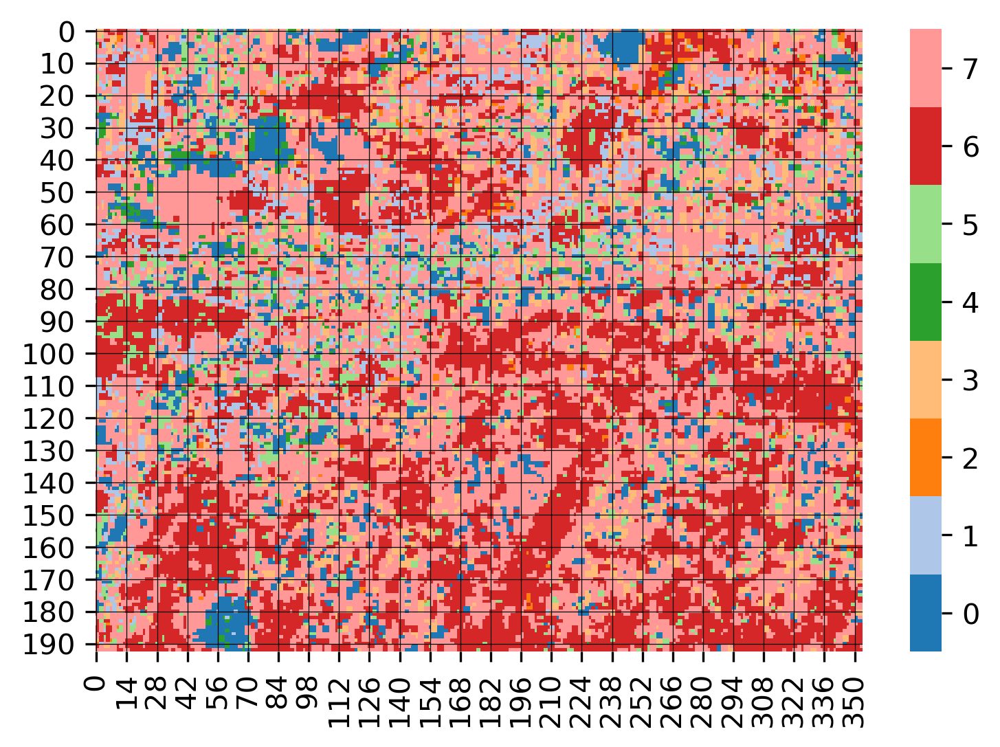

In [48]:
plt.figure()

# discrete colormap (n samples from a given cmap)
cmap = sns.color_palette('tab20', n_clusters) 
fig, ax = plt.subplots(dpi=300) 
ax = sns.heatmap(error, cmap=cmap) 

# modify colorbar:
colorbar = ax.collections[0].colorbar 
r = colorbar.vmax - colorbar.vmin 
colorbar.set_ticks([colorbar.vmin + r / n_clusters * (0.5 + i) for i in range(n_clusters)])
colorbar.set_ticklabels(list(range(n_clusters)))
plt.grid(color='black', linewidth=0.3)

#save and plot
plt.savefig(f'{figures_filepath}/Clusters_Autoencoders.png', format='png', dpi=300)
plt.show()

**TRUE COLOR COMPOSITE**

In [49]:
best_pred = []
for c in range(n_clusters):
    cluster = error == c
    prediction_cluster = prediction[c]
    pred_cluster = cluster * prediction_cluster
    best_pred.append(pred_cluster)
best_pred = np.array(best_pred)
best_pred = np.sum(best_pred, axis = 0)
best_pred.shape

(14, 193, 354)

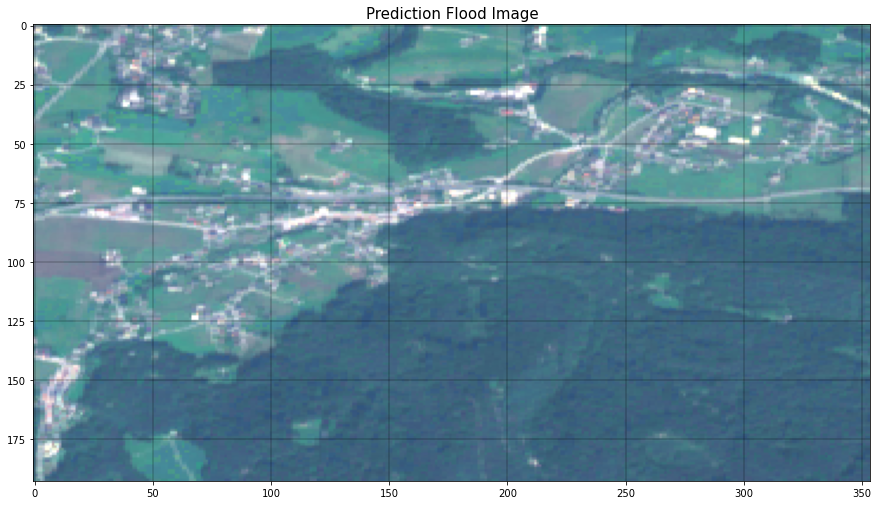

In [50]:
plt.figure(figsize = (15,15))
image = best_pred
img = np.dstack((image[3, ...]/1500, image[2, ...]/1500, image[1, ...]/1500))
img = np.clip(img, 0, 1)
plt.imshow(np.array(img))
plt.grid(color='black', linewidth=0.3)
plt.title(f'Prediction Flood Image', fontsize=15)
plt.savefig(f'{figures_filepath}/reconstruction_TCC.png', format='png', dpi=300)
plt.show()

# End :)